# **Intro CVAE**
In this notebook I use a conditional variational autoencoder (CVAE) in order to determine the single-cell perturbation effect.
The VAE is conditioned on the sample ID and perturbation status.



The experimental set-up is as follows:
All data is from Kang dataset.
We generate pesudobulks from the original data, which contains 8 samples and 1 stimulated and one ctrl condition per sample.
We either perturb all cells, a single cell-type, or no cell types. 
This is done when we generate the pseudobulks by sampling from either perturbed or non-perturbed cells within each sample.
This is denoted in the parameter `exp_id`, it can be "all-kang", "mono-kang", "b-kang", "cd4Naive-kang", or "none-kang"
This is like a perturbation that would cause one cell type to change.
We use 2 samples as the "labeled" data (meaning each sample has a ground truth cell-type proportion and it is from the cell-type proportion) and 6 samples with unlabeled data (ground truth proportions are not used in training.)




A lot of the model code was taken from this tutorial: https://github.com/nnormandin/Conditional_VAE/blob/master/Conditional_VAE.ipynb


# **Imports**

In [114]:
# general imports
import warnings
import numpy as np
import scanpy as sc

import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Lambda, Flatten, Softmax, ReLU, ELU, LeakyReLU
from tensorflow.keras.layers import concatenate as concat
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras import backend as K
from tensorflow.keras.losses import mean_absolute_error, mean_squared_error, KLDivergence
from tensorflow.keras.datasets import mnist
from tensorflow.keras.activations import relu, linear
from tensorflow.keras.utils import to_categorical, normalize, plot_model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam, SGD
import matplotlib.pyplot as plt
from scipy.spatial import distance_matrix
from scipy.stats import spearmanr, pearsonr, rankdata
from scipy.spatial.distance import euclidean
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.metrics import accuracy_score, average_precision_score
from PIL import Image

from tqdm import tnrange, tqdm_notebook
import ipywidgets

# Images, plots, display, and visualization
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import scale, MinMaxScaler
from matplotlib_venn import venn2
from upsetplot import from_contents, UpSet

# programming stuff
import time
import os
import pickle
from pathlib import Path

# import the VAE code
import sys
sys.path.insert(1, '../../')
sys.path.insert(1, '../')
from buddi import buddi
from buddi.comparator_models import cvae
from buddi.preprocessing import sc_preprocess
from buddi.plotting import validation_plotting as vp


# disable eager execution
# https://github.com/tensorflow/tensorflow/issues/47311#issuecomment-786116401
from tensorflow.python.framework.ops import disable_eager_execution
disable_eager_execution()


In [115]:
## parameters
sc_aug_data_path = f"{os.getcwd()}/../../data/single_cell_data/augmented_sciplex_data/"
res_data_path = f"{os.getcwd()}/../../results/single_cell_data/CVAE_sciplex/"

cibersort_genes_path = (f"{os.getcwd()}/../../data/single_cell_data/cibersort_sciplex/" +
                        "CIBERSORTx_Job67_test_cybersort_sig_inferred_phenoclasses" +
                        ".CIBERSORTx_Job67_test_cybersort_sig_inferred_refsample.bm.K999.txt")


num_genes = 7000

exp_id = "all-sciplex"
curr_treatment = "MCF7"
res_id = f"{curr_treatment}-sciplex"


RETRAIN_MODELS = True

# Set-up experimental variables

In [116]:

##################################################
#####. set up experiment specific variables
##################################################

# number expected cell types
n_cell_types = 3

# number of patients/domains/samples expected
n_tot_samples = 1 # 

# number of drugs 
# one-hot encoded
n_drugs = 6

# number of types of sequencing (one-hot encoded)
n_tech = 2


# **Load / Pre-process data**
Import pre-processed pseudobulks

In [117]:


# read in all the data

stim_order = ['CTRL', "STIM"]
train_order = ['Train', "Test"]
cell_order = [curr_treatment]
drug_order = ["Tanespimycin (17-AAG)", "Fedratinib (SAR302503, TG101348)",
              "Trametinib (GSK1120212)", "Triamcinolone Acetonide", "Trichostatin A (TSA)"]

X_full = None
Y_full = None
meta_df = None
for curr_train in train_order:
    for curr_stim in stim_order:
        for curr_drug in drug_order:
            for curr_cell_type in cell_order:

                curr_samp = f"{curr_drug}_{curr_cell_type}"

                print(curr_samp)

                pseudobulks_df, prop_df, gene_df, sig_df, metadata_df = sc_preprocess.read_single_pseudobulk_file(sc_aug_data_path, curr_samp, curr_stim, curr_train, exp_id)
                pseudobulks_df.columns = gene_df

                if X_full is None:
                    X_full, Y_full, meta_df = pseudobulks_df, prop_df, metadata_df
                else:
                    X_full = pd.concat([X_full, pseudobulks_df])
                    Y_full = pd.concat([Y_full, prop_df])
                    meta_df = pd.concat([meta_df, metadata_df])

X_full.columns = gene_df

# the perturbation is applied in a cell type specific manner
meta_df['perturbation'] = meta_df['perturbation'] + '_' + meta_df['cell_type_perturbed']
meta_df['perturbation'].iloc[np.where(meta_df.stim == "CTRL")] = "control"
meta_df["sample_id"] = "samp1"

# for the bulks, only keep the samples with
# the perturbed cell type as the majority
# or less than 20%

Y_max = np.copy(Y_full)
Y_max = np.argmax(Y_max, axis=1)
Y_max = Y_full.columns[Y_max]
meta_df["Y_max"] = Y_max

#idx_sc = np.where(meta_df.samp_type != "bulk")[0]
#idx_bulk_pert = np.where((meta_df.samp_type == "bulk") & (meta_df.Y_max == curr_treatment))[0]
#idx_keep = np.union1d(idx_sc, idx_bulk_pert)

#X_full = X_full.iloc[idx_keep]
#Y_full = Y_full.iloc[idx_keep]
#meta_df = meta_df.iloc[idx_keep]

Tanespimycin (17-AAG)_MCF7
Fedratinib (SAR302503, TG101348)_MCF7
Trametinib (GSK1120212)_MCF7
Triamcinolone Acetonide_MCF7
Trichostatin A (TSA)_MCF7
Tanespimycin (17-AAG)_MCF7
Fedratinib (SAR302503, TG101348)_MCF7
Trametinib (GSK1120212)_MCF7
Triamcinolone Acetonide_MCF7
Trichostatin A (TSA)_MCF7
Tanespimycin (17-AAG)_MCF7


Fedratinib (SAR302503, TG101348)_MCF7
Trametinib (GSK1120212)_MCF7
Triamcinolone Acetonide_MCF7
Trichostatin A (TSA)_MCF7
Tanespimycin (17-AAG)_MCF7
Fedratinib (SAR302503, TG101348)_MCF7
Trametinib (GSK1120212)_MCF7
Triamcinolone Acetonide_MCF7
Trichostatin A (TSA)_MCF7


# Define indices and set-up metadata

In [118]:

##################################################
#####. Design the experiment
##################################################


X_orig = np.copy(X_full)

# set up the metadata arrays and indices
samp_label = np.asarray(meta_df.sample_id)
index_label, numeric_label = np.unique(samp_label, return_inverse=True)
Label_full = numeric_label
label_full = to_categorical(numeric_label)

samp_drug = np.asarray(meta_df.perturbation)
index_drug, numeric_drug = np.unique(samp_drug, return_inverse=True)
Drug_full = numeric_drug
drug_full = to_categorical(numeric_drug)

samp_bulk = np.asarray(meta_df.samp_type)
index_bulk, numeric_bulk = np.unique(samp_bulk, return_inverse=True)
Bulk_full = numeric_bulk
bulk_full = to_categorical(numeric_bulk)


idx_train = np.where(meta_df.isTraining=="Train")[0] 
idx_test = np.where(meta_df.isTraining!="Train")[0] 
idx_bulk = np.where(meta_df.samp_type == "bulk")[0]
idx_sc = np.where(meta_df.samp_type != "bulk")[0]
idx_drug = np.where(meta_df.stim != "CTRL")[0]
idx_random = np.where(meta_df.cell_prop_type == "random")[0]

Y_max = np.copy(Y_full)
Y_max = np.argmax(Y_max, axis=1)
Y_max = Y_full.columns[Y_max]
meta_df["Y_max"] = Y_max

# now seperate out the training and testing data
X_train_df = X_full.iloc[idx_train]
Y_train_df = Y_full.iloc[idx_train]


# try using the cibersort genes
cibersort_df = pd.read_csv(cibersort_genes_path, sep="\t" )
cibersort_genes = cibersort_df["NAME"].values.tolist()

# only keep cibersort genes that are in common genes
cibersort_genes = np.intersect1d(gene_df, cibersort_genes)

# convert to data matrices
X_train = X_train_df.to_numpy()
Y_train = Y_train_df.to_numpy()


## get the top variable genes
X_colmean = X_train.mean(axis=0)
X_colvar = X_train.var(axis=0)
X_CoV = np.array(np.divide(X_colvar, X_colmean+0.001))

# need to get the genes such that
# the union of the highly variable and the
# CIBERSORTx genes are 7000 total
num_genes_found = False
initial_count = 7000
while not num_genes_found:
    idx_top = np.argpartition(X_CoV, -initial_count)[-initial_count:]
    top_gene_df = gene_df.iloc[idx_top]
    CoV_only = np.union1d(top_gene_df, cibersort_genes)
    if len(CoV_only) == 7000:
        num_genes_found = True
    else:
        initial_count = initial_count -1

idx_top = np.argpartition(X_CoV, -initial_count)[-initial_count:] 
gene_df = gene_df.iloc[idx_top]



# compare our variable genes with cibersort defined genes

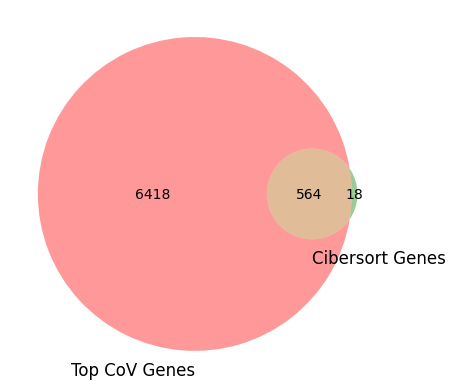

In [119]:

venn2([set(gene_df), set(cibersort_genes)], set_labels = ('Top CoV Genes', 'Cibersort Genes'))
plt.show()

In [120]:
union_genes = np.union1d(gene_df, cibersort_genes)
len(union_genes)

7000

# Normalize data

In [121]:
X_full = X_full.loc[:,union_genes]

## normalize within sample
clip_upper = np.quantile(X_full, 0.9)
X_full = np.clip(X_full, 0, clip_upper)
scaler = MinMaxScaler()
scaler.fit(X_full)

# now normalize with the scaler trained on the 
# training data
X_full = scaler.transform(X_full)

# for unknown proportions; 
# this is bulks used in training
idx_bulk_train = np.intersect1d(idx_bulk, idx_train) 

X_unkp = X_full[idx_bulk_train,]
label_unkp = label_full[idx_bulk_train,]
drug_unkp = drug_full[idx_bulk_train,]
bulk_unkp = bulk_full[idx_bulk_train,]
y_unkp = Y_full.iloc[idx_bulk_train]
y_unkp = y_unkp.to_numpy()

# for known proportions
idx_sc_train = np.intersect1d(idx_sc, idx_train) 

X_kp = X_full[idx_sc_train,]
label_kp = label_full[idx_sc_train,]
drug_kp = drug_full[idx_sc_train,]
bulk_kp = bulk_full[idx_sc_train,]
y_kp = Y_full.iloc[idx_sc_train]
y_kp = y_kp.to_numpy()


X_cvae = X_full[idx_train,]
label_cvae = label_full[idx_train,]
bulk_cvae = bulk_full[idx_train,]
drug_cvae = drug_full[idx_train,]
y_cvae = Y_full.iloc[idx_train,]




# Plot all data

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 40000 samples in 0.616s...
[t-SNE] Computed neighbors for 40000 samples in 30.503s...
[t-SNE] Computed conditional probabilities for sample 1000 / 40000
[t-SNE] Computed conditional probabilities for sample 2000 / 40000
[t-SNE] Computed conditional probabilities for sample 3000 / 40000
[t-SNE] Computed conditional probabilities for sample 4000 / 40000
[t-SNE] Computed conditional probabilities for sample 5000 / 40000
[t-SNE] Computed conditional probabilities for sample 6000 / 40000
[t-SNE] Computed conditional probabilities for sample 7000 / 40000
[t-SNE] Computed conditional probabilities for sample 8000 / 40000
[t-SNE] Computed conditional probabilities for sample 9000 / 40000
[t-SNE] Computed conditional probabilities for sample 10000 / 40000
[t-SNE] Computed conditional probabilities for sample 11000 / 40000
[t-SNE] Computed conditional probabilities for sample 12000 / 40000
[t-SNE] Computed conditional probabilities for sa

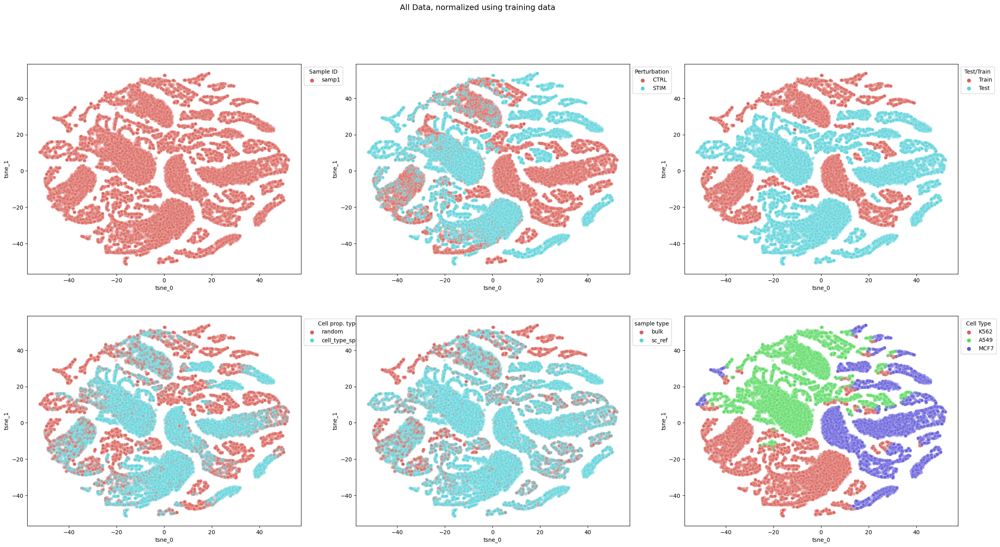

In [122]:
## plot samples
plot_df = vp.get_tsne_for_plotting(X_full)

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1) 
Y_temp = Y_full.columns[Y_temp]

vp.plot_tsne(plot_df, meta_df.sample_id.to_numpy(), axs[0,0], title=f"", legend_title="Sample ID")
vp.plot_tsne(plot_df, meta_df.stim.to_numpy(), axs[0,1], title=f"", legend_title="Perturbation")
vp.plot_tsne(plot_df, meta_df.isTraining.to_numpy(), axs[0,2], title=f"", legend_title="Test/Train")
vp.plot_tsne(plot_df, meta_df.cell_prop_type.to_numpy(), axs[1,0], title=f"", legend_title="Cell prop. type")
vp.plot_tsne(plot_df, meta_df.samp_type.to_numpy(), axs[1,1], title=f"", legend_title="sample type")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"", legend_title="Cell Type")


fig.suptitle("All Data, normalized using training data", fontsize=14)


fig.show()


# **Run CVAE**

## Hyperparameter Search

We are going to search over 2 parameters: 

1.  the beta_kl (0.001, 0.01, 1, 10)
2.  the number of epochs  (50, 100)

In [123]:
# curr_n_epoch=50
# curr_kl = 0.001
# params = cvae.CVAETrainParameters(n_epoch=curr_n_epoch, beta_kl=curr_kl)

# curr_exp_id = f"{curr_n_epoch}_{curr_kl}_{exp_id}"
# res = cvae.train_cvae(res_data_path, curr_exp_id, use_cvae4=True, 
#             n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
#             X_cvae=X_cvae, label_cvae=label_cvae, bulk_cvae=bulk_cvae, drug_cvae=drug_cvae,
#             params=params)

In [124]:
# curr_n_epoch=100
# curr_kl = 0.001
# params = cvae.CVAETrainParameters(n_epoch=curr_n_epoch, beta_kl=curr_kl)

# curr_exp_id = f"{curr_n_epoch}_{curr_kl}_{exp_id}"
# res = cvae.train_cvae(res_data_path, curr_exp_id, use_cvae4=True, 
#             n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
#             X_cvae=X_cvae, label_cvae=label_cvae, bulk_cvae=bulk_cvae, drug_cvae=drug_cvae,
#             params=params)

In [125]:
# curr_n_epoch=50
# curr_kl = 0.01
# params = cvae.CVAETrainParameters(n_epoch=curr_n_epoch, beta_kl=curr_kl)

# curr_exp_id = f"{curr_n_epoch}_{curr_kl}_{exp_id}"
# res = cvae.train_cvae(res_data_path, curr_exp_id, use_cvae4=True, 
#             n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
#             X_cvae=X_cvae, label_cvae=label_cvae, bulk_cvae=bulk_cvae, drug_cvae=drug_cvae,
#             params=params)

In [126]:
# curr_n_epoch=100
# curr_kl = 0.01
# params = cvae.CVAETrainParameters(n_epoch=curr_n_epoch, beta_kl=curr_kl)

# curr_exp_id = f"{curr_n_epoch}_{curr_kl}_{exp_id}"
# res = cvae.train_cvae(res_data_path, curr_exp_id, use_cvae4=True, 
#             n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
#             X_cvae=X_cvae, label_cvae=label_cvae, bulk_cvae=bulk_cvae, drug_cvae=drug_cvae,
#             params=params)

In [127]:
# curr_n_epoch=50
# curr_kl = 0.1
# params = cvae.CVAETrainParameters(n_epoch=curr_n_epoch, beta_kl=curr_kl)

# curr_exp_id = f"{curr_n_epoch}_{curr_kl}_{exp_id}"
# res = cvae.train_cvae(res_data_path, curr_exp_id, use_cvae4=True, 
#             n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
#             X_cvae=X_cvae, label_cvae=label_cvae, bulk_cvae=bulk_cvae, drug_cvae=drug_cvae,
#             params=params)

In [128]:
# curr_n_epoch=100
# curr_kl = 0.1
# params = cvae.CVAETrainParameters(n_epoch=curr_n_epoch, beta_kl=curr_kl)

# curr_exp_id = f"{curr_n_epoch}_{curr_kl}_{exp_id}"
# res = cvae.train_cvae(res_data_path, curr_exp_id, use_cvae4=True, 
#             n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
#             X_cvae=X_cvae, label_cvae=label_cvae, bulk_cvae=bulk_cvae, drug_cvae=drug_cvae,
#             params=params)

In [129]:
# curr_n_epoch=50
# curr_kl = 1
# params = cvae.CVAETrainParameters(n_epoch=curr_n_epoch, beta_kl=curr_kl)

# curr_exp_id = f"{curr_n_epoch}_{curr_kl}_{exp_id}"
# res = cvae.train_cvae(res_data_path, curr_exp_id, use_cvae4=True, 
#             n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
#             X_cvae=X_cvae, label_cvae=label_cvae, bulk_cvae=bulk_cvae, drug_cvae=drug_cvae,
#             params=params)

In [130]:
# curr_n_epoch=100
# curr_kl = 1
# params = cvae.CVAETrainParameters(n_epoch=curr_n_epoch, beta_kl=curr_kl)

# curr_exp_id = f"{curr_n_epoch}_{curr_kl}_{exp_id}"
# res = cvae.train_cvae(res_data_path, curr_exp_id, use_cvae4=True, 
#             n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
#             X_cvae=X_cvae, label_cvae=label_cvae, bulk_cvae=bulk_cvae, drug_cvae=drug_cvae,
#             params=params)

In [131]:
# curr_n_epoch=50
# curr_kl = 10
# params = cvae.CVAETrainParameters(n_epoch=curr_n_epoch, beta_kl=curr_kl)

# curr_exp_id = f"{curr_n_epoch}_{curr_kl}_{exp_id}"
# res = cvae.train_cvae(res_data_path, curr_exp_id, use_cvae4=True, 
#             n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
#             X_cvae=X_cvae, label_cvae=label_cvae, bulk_cvae=bulk_cvae, drug_cvae=drug_cvae,
#             params=params)

In [132]:
# curr_n_epoch=100
# curr_kl = 10
# params = cvae.CVAETrainParameters(n_epoch=curr_n_epoch, beta_kl=curr_kl)

# curr_exp_id = f"{curr_n_epoch}_{curr_kl}_{exp_id}"
# res = cvae.train_cvae(res_data_path, curr_exp_id, use_cvae4=True, 
#             n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
#             X_cvae=X_cvae, label_cvae=label_cvae, bulk_cvae=bulk_cvae, drug_cvae=drug_cvae,
#             params=params)

# **Results**

Looking at all the results, we see that beta_kl = 1 performs the best overall. We will go forward with this hyperparameters and run them three times to get 3 different trained models that we can use for downstream validation.

2024-09-13 13:28:57.428172: W tensorflow/c/c_api.cc:304] Operation '{name:'encoder_2_17/bias/Assign' id:10720 op device:{requested: '', assigned: ''} def:{{{node encoder_2_17/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](encoder_2_17/bias, encoder_2_17/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-09-13 13:28:57.750823: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_8/truediv/y' id:10781 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_8/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Ei

2024-09-13 13:28:59.030685: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_out_25/bias/Assign' id:10866 op device:{requested: '', assigned: ''} def:{{{node decoder_out_25/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](decoder_out_25/bias, decoder_out_25/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2024-09-13 13:29:04.260547: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_8/mul' id:10949 op device:{requested: '', assi

INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/sciplex_comparators/../../results/single_cell_data/CVAE_sciplex//model1_MCF7-sciplex_cvae/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/sciplex_comparators/../../results/single_cell_data/CVAE_sciplex//model1_MCF7-sciplex_cvae/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/sciplex_comparators/../../results/single_cell_data/CVAE_sciplex//model1_MCF7-sciplex_encoder/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/sciplex_comparators/../../results/single_cell_data/CVAE_sciplex//model1_MCF7-sciplex_encoder/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/sciplex_comparators/../../results/single_cell_data/CVAE_sciplex//model1_MCF7-sciplex_decoder/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/sciplex_comparators/../../results/single_cell_data/CVAE_sciplex//model1_MCF7-sciplex_decoder/assets
2024-09-13 13:33:31.307142: W tensorflow/c/c_api.cc:304] Operation '{name:'encoder_1_18/bias/Assign' id:11757 op device:{requested: '', assigned: ''} def:{{{node encoder_1_18/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](encoder_1_18/bias, encoder_1_18/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-09-13 13:33:31.617616: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_9/truediv/y' id:11842 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_9/truediv/y}} = Const[_has_manual_control_dependencies=true, dtyp

INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/sciplex_comparators/../../results/single_cell_data/CVAE_sciplex//model2_MCF7-sciplex_cvae/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/sciplex_comparators/../../results/single_cell_data/CVAE_sciplex//model2_MCF7-sciplex_cvae/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/sciplex_comparators/../../results/single_cell_data/CVAE_sciplex//model2_MCF7-sciplex_encoder/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/sciplex_comparators/../../results/single_cell_data/CVAE_sciplex//model2_MCF7-sciplex_encoder/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/sciplex_comparators/../../results/single_cell_data/CVAE_sciplex//model2_MCF7-sciplex_decoder/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/sciplex_comparators/../../results/single_cell_data/CVAE_sciplex//model2_MCF7-sciplex_decoder/assets
2024-09-13 13:38:06.252079: W tensorflow/c/c_api.cc:304] Operation '{name:'encoder_2_19/bias/Assign' id:12842 op device:{requested: '', assigned: ''} def:{{{node encoder_2_19/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](encoder_2_19/bias, encoder_2_19/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-09-13 13:38:06.611622: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_10/truediv/y' id:12903 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_10/truediv/y}} = Const[_has_manual_control_dependencies=true, dt

INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/sciplex_comparators/../../results/single_cell_data/CVAE_sciplex//model3_MCF7-sciplex_cvae/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/sciplex_comparators/../../results/single_cell_data/CVAE_sciplex//model3_MCF7-sciplex_cvae/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/sciplex_comparators/../../results/single_cell_data/CVAE_sciplex//model3_MCF7-sciplex_encoder/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/sciplex_comparators/../../results/single_cell_data/CVAE_sciplex//model3_MCF7-sciplex_encoder/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/sciplex_comparators/../../results/single_cell_data/CVAE_sciplex//model3_MCF7-sciplex_decoder/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/sciplex_comparators/../../results/single_cell_data/CVAE_sciplex//model3_MCF7-sciplex_decoder/assets


2024-09-13 13:42:34.559637: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_155' id:13955 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_155}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_66, Identity_1552)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-13 13:42:35.131727: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_160' id:14064 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_160}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_69, Identity_1557)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-13 13:42:35.939386: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_163' id:14176 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_163}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_70, Identity_1560)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-13 13:42:36.520155: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_170' id:14289 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_170}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_74, Identity_1567)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-13 13:42:37.295365: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_183' id:14421 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_183}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_80, Identity_1580)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-09-13 13:42:37.987987: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_189' id:14532 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_189}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_83, Identity_1586)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


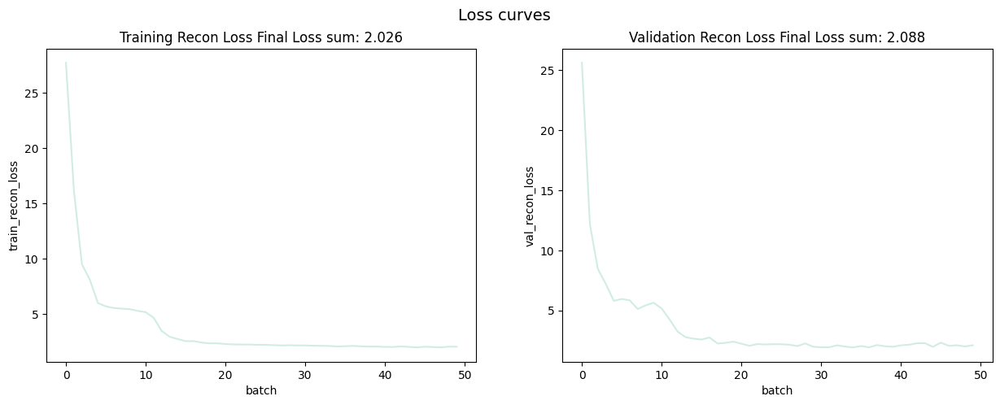

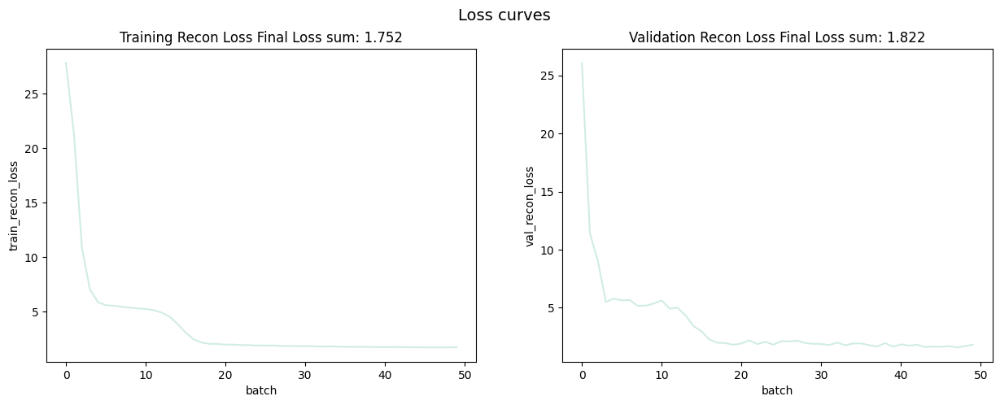

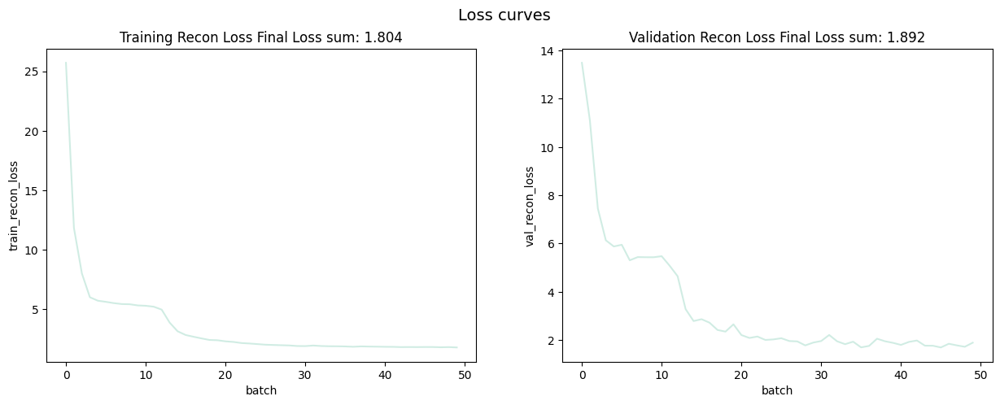

In [133]:
curr_n_epoch=50
curr_kl = 1 # 10

if RETRAIN_MODELS: #RETRAIN_MODELS
    params = cvae.CVAETrainParameters(n_epoch=curr_n_epoch, beta_kl=curr_kl)

    ## model 1
    curr_exp_id = f"model1_{res_id}"
    res1 = cvae.train_cvae(res_data_path, curr_exp_id, use_cvae4=True, 
                n_tot_samples=n_drugs, n_drugs=n_drugs, n_tech=n_drugs, 
                X_cvae=X_cvae, label_cvae=drug_cvae, bulk_cvae=drug_cvae, drug_cvae=drug_cvae,
                params=params)


    ## model 2
    curr_exp_id = f"model2_{res_id}"
    res2 = cvae.train_cvae(res_data_path, curr_exp_id, use_cvae4=True, 
                n_tot_samples=n_drugs, n_drugs=n_drugs, n_tech=n_drugs, 
                X_cvae=X_cvae, label_cvae=drug_cvae, bulk_cvae=drug_cvae, drug_cvae=drug_cvae,
                params=params)

    ## model 3
    curr_exp_id = f"model3_{res_id}"
    res3 = cvae.train_cvae(res_data_path, curr_exp_id, use_cvae4=True, 
                n_tot_samples=n_drugs, n_drugs=n_drugs, n_tech=n_drugs, 
                X_cvae=X_cvae, label_cvae=drug_cvae, bulk_cvae=drug_cvae, drug_cvae=drug_cvae,
                params=params)        


res1_enc = tf.keras.models.load_model(f"{res_data_path}/model1_{res_id}_encoder")
res1_dec = tf.keras.models.load_model(f"{res_data_path}/model1_{res_id}_decoder")


res2_enc = tf.keras.models.load_model(f"{res_data_path}/model2_{res_id}_encoder")
res2_dec = tf.keras.models.load_model(f"{res_data_path}/model2_{res_id}_decoder")


res3_enc = tf.keras.models.load_model(f"{res_data_path}/model3_{res_id}_encoder")
res3_dec = tf.keras.models.load_model(f"{res_data_path}/model3_{res_id}_decoder")


# visualize reconstructions

### subset data

In [134]:
# take all training data
recon_idx = meta_df.isTraining == "Train"
recon_idx = np.where(recon_idx)[0]
recon_idx = np.random.choice(recon_idx, 5000, replace=True)

# subset our data

meta_temp = meta_df.iloc[recon_idx]

X_temp = np.copy(X_full[recon_idx])

Y_temp = np.copy(Y_full.iloc[recon_idx])
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_full.columns[Y_temp]

label_temp = np.copy(label_full[recon_idx])
label_num = np.copy(Label_full[recon_idx])

perturb_temp = drug_full[recon_idx]
perturb_num = np.copy(Drug_full[recon_idx])

bulk_temp = bulk_full[recon_idx]




### plot data

/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-09-13 13:42:38.778538: W tensorflow/c/c_api.cc:304] Operation '{name:'mu_slack_20/BiasAdd' id:13978 op device:{requested: '', assigned: ''} def:{{{node mu_slack_20/BiasAdd}} = BiasAdd[T=DT_FLOAT, _has_manual_control_dependencies=true, data_format="NHWC"](mu_slack_20/MatMul, mu_slack_20/BiasAdd/ReadVariableOp)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-09-13 13:42:39.177611: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_out_31/Sigmoid' id:14081 op device:{requested: '', assigned: ''} def:{{{node 

(10000, 2)
(10000, 2)


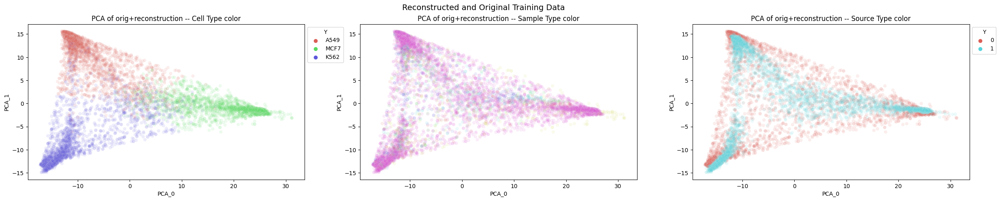

In [135]:
res1_recon_plot = cvae.plot_reconstruction_cvae(res1_enc, res1_dec, 
        X_temp, Y_temp, perturb_temp, perturb_num, perturb_temp, perturb_temp,
        batch_size=500, use_cvae4=True)

/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-09-13 13:42:41.490299: W tensorflow/c/c_api.cc:304] Operation '{name:'mu_slack_21/BiasAdd' id:14211 op device:{requested: '', assigned: ''} def:{{{node mu_slack_21/BiasAdd}} = BiasAdd[T=DT_FLOAT, _has_manual_control_dependencies=true, data_format="NHWC"](mu_slack_21/MatMul, mu_slack_21/BiasAdd/ReadVariableOp)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-09-13 13:42:41.875877: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_out_32/Sigmoid' id:14314 op device:{requested: '', assigned: ''} def:{{{node 

(10000, 2)
(10000, 2)


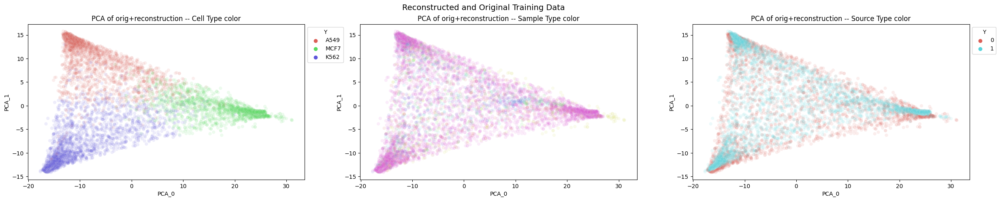

In [136]:
res2_recon_plot = cvae.plot_reconstruction_cvae(res2_enc, res2_dec, 
        X_temp, Y_temp, perturb_temp, perturb_num, perturb_temp, perturb_temp,
        batch_size=500, use_cvae4=True)

/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-09-13 13:42:44.185562: W tensorflow/c/c_api.cc:304] Operation '{name:'mu_slack_22/BiasAdd' id:14444 op device:{requested: '', assigned: ''} def:{{{node mu_slack_22/BiasAdd}} = BiasAdd[T=DT_FLOAT, _has_manual_control_dependencies=true, data_format="NHWC"](mu_slack_22/MatMul, mu_slack_22/BiasAdd/ReadVariableOp)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-09-13 13:42:44.587201: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_out_33/Sigmoid' id:14547 op device:{requested: '', assigned: ''} def:{{{node 

(10000, 2)
(10000, 2)


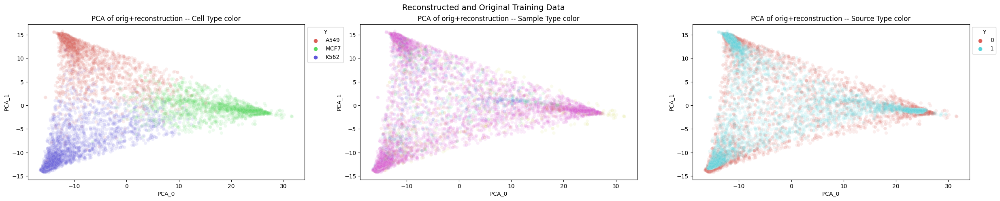

In [137]:
res3_recon_plot = cvae.plot_reconstruction_cvae(res3_enc, res3_dec, 
        X_temp, Y_temp, perturb_temp, perturb_num, perturb_temp, perturb_temp,
        batch_size=500, use_cvae4=True)

# Plot latent spaces

In [138]:
# get samples for plotting

label_1hot_temp = np.copy(label_full)
bulk_1hot_temp = np.copy(bulk_full)
perturb_1hot_temp = np.copy(drug_full)


# get the single cell data 
idx_sc_ref = np.where(meta_df.isTraining == "Train")[0]


## this is to match up sample amounts across comparators
idx_sc_ref = np.random.choice(idx_sc_ref, 2000, replace=True) 


X_sc_ref = np.copy(X_full)
X_sc_ref = X_sc_ref[idx_sc_ref,]

# get the sample_ids we will perturb
sample_code = label_1hot_temp[idx_sc_ref]

# get the bulk code
bulk_code = bulk_1hot_temp[idx_sc_ref]


#####
# get (un)perturbed latent codes
#####
perturbed_code = perturb_1hot_temp[idx_sc_ref]




(2000, 2)
(2000, 2)


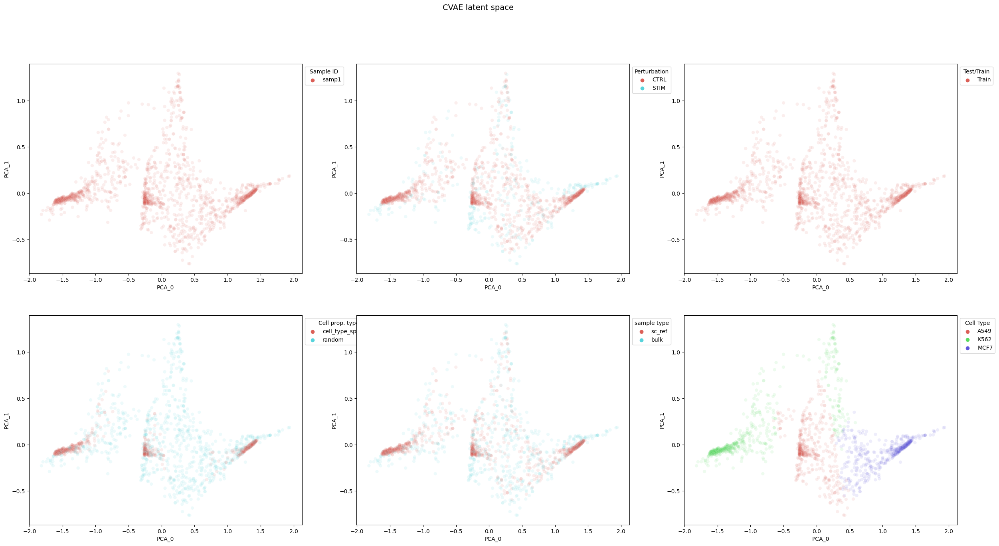

In [139]:

######
# now put it all together
######

mu_slack, z_slack = res1_enc.predict([X_sc_ref, perturbed_code, perturbed_code, perturbed_code], batch_size=500)

## plot samples

plot_df = vp.get_pca_for_plotting(mu_slack)

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_sc_ref])
Y_temp = np.argmax(Y_temp, axis=1) 
Y_temp = Y_full.columns[Y_temp]

vp.plot_pca(plot_df, meta_df.sample_id.to_numpy()[idx_sc_ref], axs[0,0], title=f"", legend_title="Sample ID")
vp.plot_pca(plot_df, meta_df.stim.to_numpy()[idx_sc_ref], axs[0,1], title=f"", legend_title="Perturbation")
vp.plot_pca(plot_df, meta_df.isTraining.to_numpy()[idx_sc_ref], axs[0,2], title=f"", legend_title="Test/Train")
vp.plot_pca(plot_df, meta_df.cell_prop_type.to_numpy()[idx_sc_ref], axs[1,0], title=f"", legend_title="Cell prop. type")
vp.plot_pca(plot_df, meta_df.samp_type.to_numpy()[idx_sc_ref], axs[1,1], title=f"", legend_title="sample type")
vp.plot_pca(plot_df, Y_temp, axs[1,2], title=f"", legend_title="Cell Type")


fig.suptitle("CVAE latent space", fontsize=14)


fig.show()

(2000, 2)
(2000, 2)


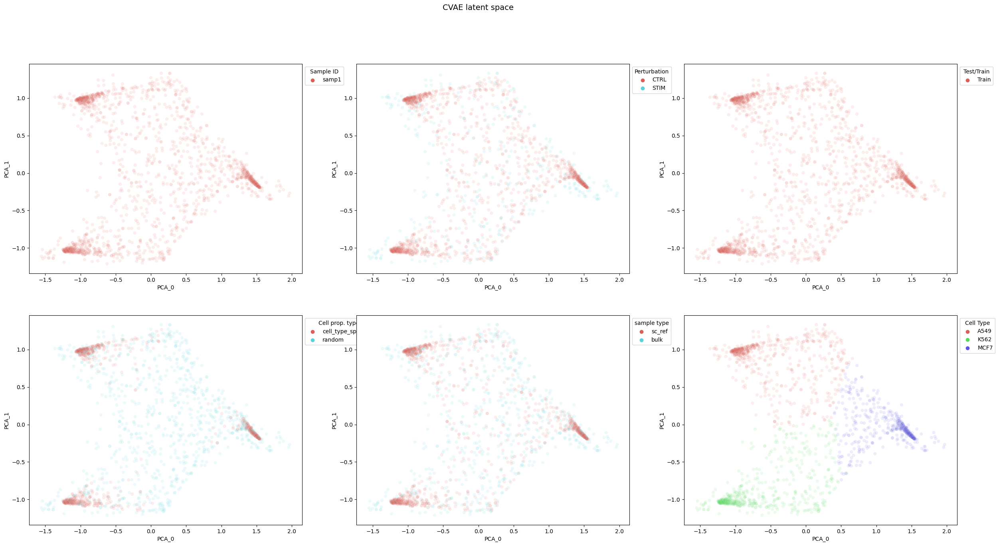

In [140]:
######
# now put it all together
######

mu_slack, z_slack = res2_enc.predict([X_sc_ref, perturbed_code, perturbed_code, perturbed_code], batch_size=500)

## plot samples

plot_df = vp.get_pca_for_plotting(mu_slack)

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_sc_ref])
Y_temp = np.argmax(Y_temp, axis=1) 
Y_temp = Y_full.columns[Y_temp]

vp.plot_pca(plot_df, meta_df.sample_id.to_numpy()[idx_sc_ref], axs[0,0], title=f"", legend_title="Sample ID")
vp.plot_pca(plot_df, meta_df.stim.to_numpy()[idx_sc_ref], axs[0,1], title=f"", legend_title="Perturbation")
vp.plot_pca(plot_df, meta_df.isTraining.to_numpy()[idx_sc_ref], axs[0,2], title=f"", legend_title="Test/Train")
vp.plot_pca(plot_df, meta_df.cell_prop_type.to_numpy()[idx_sc_ref], axs[1,0], title=f"", legend_title="Cell prop. type")
vp.plot_pca(plot_df, meta_df.samp_type.to_numpy()[idx_sc_ref], axs[1,1], title=f"", legend_title="sample type")
vp.plot_pca(plot_df, Y_temp, axs[1,2], title=f"", legend_title="Cell Type")


fig.suptitle("CVAE latent space", fontsize=14)


fig.show()

(2000, 2)
(2000, 2)


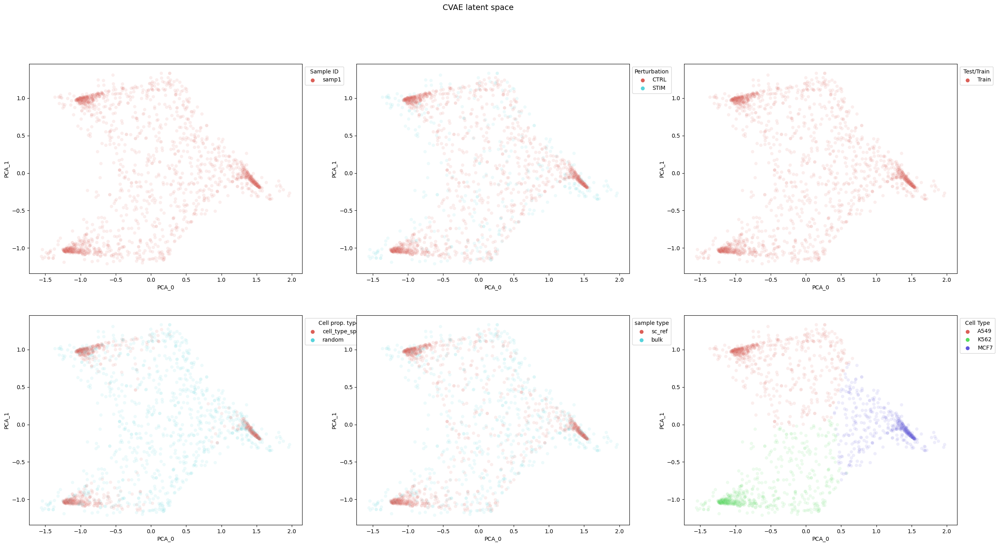

In [141]:
######
# now put it all together
######

mu_slack, z_slack = res2_enc.predict([X_sc_ref, perturbed_code, perturbed_code, perturbed_code], batch_size=500)

## plot samples

plot_df = vp.get_pca_for_plotting(mu_slack)

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_sc_ref])
Y_temp = np.argmax(Y_temp, axis=1) 
Y_temp = Y_full.columns[Y_temp]

vp.plot_pca(plot_df, meta_df.sample_id.to_numpy()[idx_sc_ref], axs[0,0], title=f"", legend_title="Sample ID")
vp.plot_pca(plot_df, meta_df.stim.to_numpy()[idx_sc_ref], axs[0,1], title=f"", legend_title="Perturbation")
vp.plot_pca(plot_df, meta_df.isTraining.to_numpy()[idx_sc_ref], axs[0,2], title=f"", legend_title="Test/Train")
vp.plot_pca(plot_df, meta_df.cell_prop_type.to_numpy()[idx_sc_ref], axs[1,0], title=f"", legend_title="Cell prop. type")
vp.plot_pca(plot_df, meta_df.samp_type.to_numpy()[idx_sc_ref], axs[1,1], title=f"", legend_title="sample type")
vp.plot_pca(plot_df, Y_temp, axs[1,2], title=f"", legend_title="Cell Type")


fig.suptitle("CVAE latent space", fontsize=14)


fig.show()

# Do latent space projections

### drug perturbation

In [142]:
from scipy.stats import ttest_ind
import math

def get_nonperturbed_log2fc(curr_cell_type_perturbed,
                            meta_df, X_full, Y_full, 
                            label_full, bulk_full, drug_full,
                            res1, union_genes, scaler, clip_upper):
    
    curr_samp = "samp1"

    ct_perturbed_idx = np.where(meta_df["cell_type_perturbed"] == curr_cell_type_perturbed)[0]

    all_perts = meta_df.iloc[ct_perturbed_idx].perturbation.unique()
    all_perts = np.setdiff1d(all_perts, "control")

    all_Ymax = np.setdiff1d(meta_df.Y_max.unique(), curr_cell_type_perturbed)

    curr_cell_type = curr_cell_type_perturbed

    res_df = None
    log2fc_df = None
    for curr_drug in all_perts:
        for curr_Ymax in all_Ymax:

            print(f"{curr_drug} {curr_Ymax} {curr_cell_type_perturbed}")

            drug_idx = np.where((meta_df["perturbation"] == curr_drug) | (meta_df["perturbation"] == "control"))[0]

            curr_idx = np.intersect1d(drug_idx, ct_perturbed_idx)


            res1_meta_df, res1_decoded_0_0, res1_decoded_0_1, res1_top_genes = cvae.calc_CVAE_perturbation(
                                                                                    X_full[curr_idx], Y_full.iloc[curr_idx], meta_df.iloc[curr_idx], 
                                                                                    res1.encoder, res1.decoder, 
                                                                                    scaler, batch_size=500, 
                                                                                    label_1hot_full=label_full[curr_idx], 
                                                                                    bulk_1hot_full=bulk_full[curr_idx], 
                                                                                    drug_1hot_full=drug_full[curr_idx],
                                                                                    genes_ordered=union_genes, top_lim=100)



            res1_decoded_0_1 = np.clip(res1_decoded_0_1, 0, clip_upper)
            res1_decoded_0_0 = np.clip(res1_decoded_0_0, 0, clip_upper)

            real_stim, real_ctrl, proj_stim, proj_ctrl = vp.subset_sample_celltype_perturbation(X_full[curr_idx], res1_decoded_0_0, 
                                                                                            res1_decoded_0_1, scaler, curr_samp, 
                                                                                            "cell_type_specific", 
                                                                                            meta_df.iloc[curr_idx], res1_meta_df,
                                                                                            curr_Ymax)

            real_p_val = []
            subsamp_idx = np.random.choice(real_stim.shape[0], 9)
            for col_idx in range(real_stim.shape[1]):
                _, p_value = ttest_ind(real_stim[subsamp_idx,col_idx], real_ctrl[subsamp_idx,col_idx])
                real_p_val.append(p_value)

            real_p_val = [1 if math.isnan(x) else x for x in real_p_val]

            proj_p_val = []
            subsamp_idx = np.random.choice(proj_stim.shape[0], 9)
            for col_idx in range(proj_stim.shape[1]):
                _, p_value = ttest_ind(proj_stim[subsamp_idx,col_idx], proj_ctrl[subsamp_idx,col_idx])
                proj_p_val.append(p_value)

            proj_p_val = [1 if math.isnan(x) else x for x in proj_p_val]

            real_stim_med = np.median(real_stim, axis=0)
            proj_stim_med = np.median(proj_stim, axis=0)

            real_ctrl_med = np.median(real_ctrl, axis=0)
            proj_ctrl_med = np.median(proj_ctrl, axis=0)


            real_ctrl_med_1 = np.median(real_ctrl, axis=0)+1
            real_stim_med_1 = np.median(real_stim, axis=0)+1
            real_log2FC = np.log2(real_stim_med_1/real_ctrl_med_1)

            proj_ctrl_med_1 = np.median(proj_ctrl, axis=0)+1
            proj_stim_med_1 = np.median(proj_stim, axis=0)+1
            proj_log2FC = np.log2(proj_stim_med_1/proj_ctrl_med_1)

            print(len(proj_log2FC.tolist() +  real_log2FC.tolist()))
            print(len(curr_idx))

            

            num_sig_real = [True if x < 0.05/len(real_p_val) else False for x in real_p_val]
            num_sig_proj = [True if x < 0.05/len(proj_p_val) else False for x in proj_p_val]

            plot_df = pd.DataFrame({"log2FC": [np.sum(num_sig_proj), np.sum(num_sig_real)],
                                    "source":["proj", "real"],
                                    "Y_max":[curr_Ymax, curr_Ymax],
                                    "perturbation":[curr_drug, curr_drug]})

            curr_log2fc_df = pd.DataFrame({"proj_log2FC":proj_log2FC,
                                           "real_log2FC":real_log2FC,
                                            "Y_max":[curr_Ymax]*len(proj_log2FC),
                                            "perturbation":[curr_drug]*len(proj_log2FC)})
            
            if res_df is None:
                res_df = plot_df
                log2fc_df = curr_log2fc_df
            else:
                res_df = pd.concat([res_df, plot_df])
                log2fc_df = pd.concat([log2fc_df, curr_log2fc_df])

    return res_df, log2fc_df

In [143]:
res1_df, res1_log2fc_df = get_nonperturbed_log2fc(curr_treatment,
                            meta_df, X_full, Y_full, 
                            drug_full, drug_full, drug_full,
                            res1, union_genes, scaler, clip_upper)

res2_df, res2_log2fc_df = get_nonperturbed_log2fc(curr_treatment,
                            meta_df, X_full, Y_full, 
                            drug_full, drug_full, drug_full,
                            res2, union_genes, scaler, clip_upper)

res3_df, res3_log2fc_df = get_nonperturbed_log2fc(curr_treatment,
                            meta_df, X_full, Y_full, 
                            drug_full, drug_full, drug_full,
                            res3, union_genes, scaler, clip_upper)


Fedratinib (SAR302503, TG101348)_MCF7 A549 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-09-13 13:42:49.832992: W tensorflow/c/c_api.cc:304] Operation '{name:'mu_slack_17/BiasAdd' id:10749 op device:{requested: '', assigned: ''} def:{{{node mu_slack_17/BiasAdd}} = BiasAdd[T=DT_FLOAT, _has_manual_control_dependencies=true, data_format="NHWC"](mu_slack_17/MatMul, mu_slack_17/BiasAdd/ReadVariableOp)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-09-13 13:42:50.169460: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_out_26/Sigmoid' id:10888 op device:{requested: '', assigned: ''} def:{{{node 

14000
28000
Fedratinib (SAR302503, TG101348)_MCF7 K562 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Tanespimycin (17-AAG)_MCF7 A549 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Tanespimycin (17-AAG)_MCF7 K562 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Trametinib (GSK1120212)_MCF7 A549 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Trametinib (GSK1120212)_MCF7 K562 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Triamcinolone Acetonide_MCF7 A549 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Triamcinolone Acetonide_MCF7 K562 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Trichostatin A (TSA)_MCF7 A549 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Trichostatin A (TSA)_MCF7 K562 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Fedratinib (SAR302503, TG101348)_MCF7 A549 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-09-13 13:44:45.371515: W tensorflow/c/c_api.cc:304] Operation '{name:'mu_slack_18/BiasAdd' id:11810 op device:{requested: '', assigned: ''} def:{{{node mu_slack_18/BiasAdd}} = BiasAdd[T=DT_FLOAT, _has_manual_control_dependencies=true, data_format="NHWC"](mu_slack_18/MatMul, mu_slack_18/BiasAdd/ReadVariableOp)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-09-13 13:44:45.700358: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_out_28/Sigmoid' id:11949 op device:{requested: '', assigned: ''} def:{{{node 

14000
28000
Fedratinib (SAR302503, TG101348)_MCF7 K562 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Tanespimycin (17-AAG)_MCF7 A549 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Tanespimycin (17-AAG)_MCF7 K562 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Trametinib (GSK1120212)_MCF7 A549 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Trametinib (GSK1120212)_MCF7 K562 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Triamcinolone Acetonide_MCF7 A549 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Triamcinolone Acetonide_MCF7 K562 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Trichostatin A (TSA)_MCF7 A549 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Trichostatin A (TSA)_MCF7 K562 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Fedratinib (SAR302503, TG101348)_MCF7 A549 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-09-13 13:46:41.634670: W tensorflow/c/c_api.cc:304] Operation '{name:'mu_slack_19/BiasAdd' id:12871 op device:{requested: '', assigned: ''} def:{{{node mu_slack_19/BiasAdd}} = BiasAdd[T=DT_FLOAT, _has_manual_control_dependencies=true, data_format="NHWC"](mu_slack_19/MatMul, mu_slack_19/BiasAdd/ReadVariableOp)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-09-13 13:46:41.990007: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_out_30/Sigmoid' id:13010 op device:{requested: '', assigned: ''} def:{{{node 

14000
28000
Fedratinib (SAR302503, TG101348)_MCF7 K562 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Tanespimycin (17-AAG)_MCF7 A549 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Tanespimycin (17-AAG)_MCF7 K562 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Trametinib (GSK1120212)_MCF7 A549 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Trametinib (GSK1120212)_MCF7 K562 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Triamcinolone Acetonide_MCF7 A549 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Triamcinolone Acetonide_MCF7 K562 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Trichostatin A (TSA)_MCF7 A549 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000
Trichostatin A (TSA)_MCF7 K562 MCF7


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


14000
28000


<AxesSubplot: xlabel='proj_log2FC', ylabel='real_log2FC'>

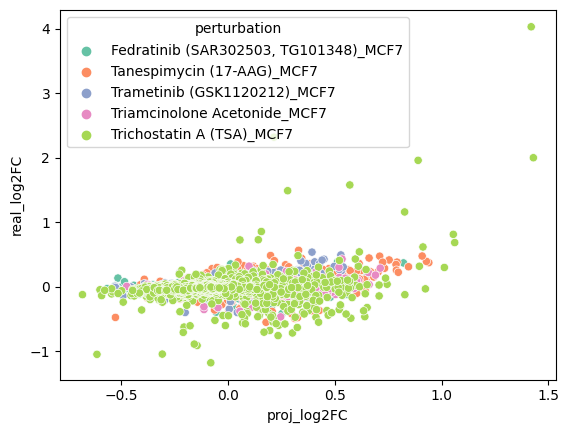

In [144]:
sns.scatterplot(data=res1_log2fc_df, x="proj_log2FC", y="real_log2FC", hue="perturbation")


In [145]:
res_data_path

'/home/natalie/projects/checkouts/buddi_analysis/l1000_sciplex_analysis/sciplex_comparators/../../results/single_cell_data/CVAE_sciplex/'

In [146]:
res3_df

,log2FC,source,Y_max,perturbation
0,284,proj,A549,"Fedratinib (SAR302503, TG101348)_MCF7"
1,0,real,A549,"Fedratinib (SAR302503, TG101348)_MCF7"
0,0,proj,K562,"Fedratinib (SAR302503, TG101348)_MCF7"
1,0,real,K562,"Fedratinib (SAR302503, TG101348)_MCF7"
0,327,proj,A549,Tanespimycin (17-AAG)_MCF7
1,0,real,A549,Tanespimycin (17-AAG)_MCF7
0,31,proj,K562,Tanespimycin (17-AAG)_MCF7
1,0,real,K562,Tanespimycin (17-AAG)_MCF7
0,9,proj,A549,Trametinib (GSK1120212)_MCF7
1,0,real,A549,Trametinib (GSK1120212)_MCF7


In [147]:
res_all = pd.concat([res1_df, res2_df, res3_df])
log2fc_res_file = os.path.join(res_data_path, f"{res_id}_CVAE_log2fc_null.csv")
res_all.to_csv(log2fc_res_file, index=False)

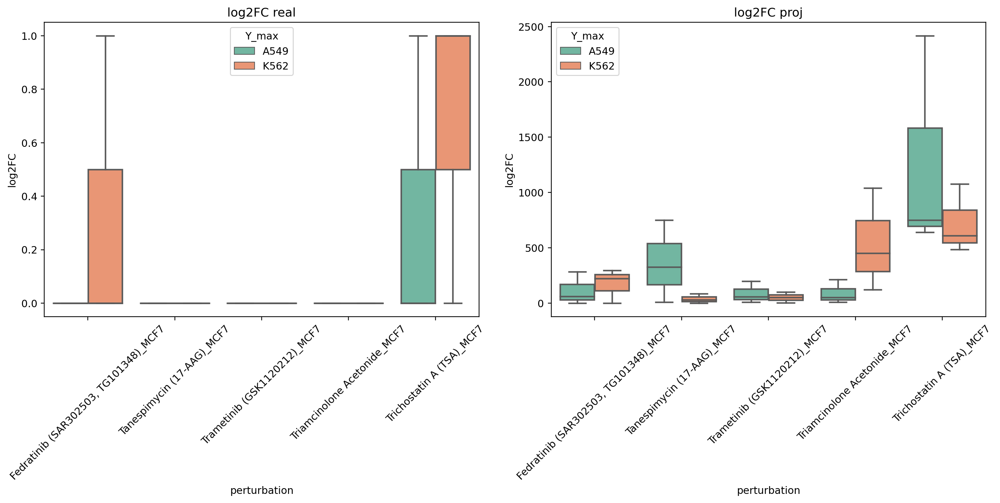

In [148]:

# plot
fig, axs = plt.subplots(1, 2, figsize=(14,7), dpi=216)

sns.boxplot(data=res_all.iloc[np.where(res_all.source == "real")[0]], 
            x="perturbation", y="log2FC",
            hue="Y_max", ax= axs[0])
axs[0].set_title("log2FC real")
axs[0].set(ylabel="log2FC")
axs[0].tick_params(axis='x', rotation=45)


sns.boxplot(data=res_all.iloc[np.where(res_all.source == "proj")[0]], 
            x="perturbation", y="log2FC",
            hue="Y_max", ax= axs[1])
axs[1].set_title("log2FC proj")
axs[1].set(ylabel="log2FC")
axs[1].tick_params(axis='x', rotation=45)


fig.show()
fig.tight_layout()



# Calculate PRAUC

In [149]:
from matplotlib_venn import venn3
from sklearn.metrics import PrecisionRecallDisplay, RocCurveDisplay, roc_curve, precision_recall_curve
from random import sample

sns.set_palette("Set2")

# get PR curve

def plot_PR_ROC(proj_ctrl, proj_stim, real_ctrl, real_stim, curr_cell_type, axs, union_genes, num_top=100):

    # this is for the "projected" expression
    # take the median for nomalization
    proj_ctrl = np.median(rankdata(proj_ctrl, axis=1), axis=0)
    proj_stim = np.median(rankdata(proj_stim, axis=1), axis=0)
    proj_log2FC = abs(proj_stim-proj_ctrl)


    real_stim = np.median(rankdata(real_stim, axis=1), axis=0)
    real_ctrl = np.median(rankdata(real_ctrl, axis=1), axis=0)
    real_log2FC = abs(real_stim-real_ctrl)


    # make dataframe of true/false positives
    proj_log2FC_df = pd.DataFrame({"proj_log2FC":proj_log2FC,
                                    "real_log2FC":real_log2FC}, index=union_genes)
    proj_log2FC_df["orig"] = proj_stim-proj_ctrl

    # make a random one
    temp_samp = sample(proj_log2FC_df["proj_log2FC"].tolist(), len(proj_log2FC_df["proj_log2FC"].tolist()))
    temp_samp = [int(a) for a in temp_samp]
    proj_log2FC_df["random"] = temp_samp


    proj_log2FC_df["top_DE"] = 0
    proj_log2FC_df = proj_log2FC_df.sort_values(["real_log2FC"], ascending=False)
    proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1




    # now do the single-cell cell type specific DE
    roc_display = RocCurveDisplay.from_predictions(proj_log2FC_df.top_DE, proj_log2FC_df["proj_log2FC"], name="CVAE", ax=axs[0])
    pr_display = PrecisionRecallDisplay.from_predictions(proj_log2FC_df.top_DE, proj_log2FC_df["proj_log2FC"], name="CVAE", ax=axs[1])


    roc_display = RocCurveDisplay.from_predictions(proj_log2FC_df.top_DE, proj_log2FC_df.random, name="random",ax= axs[0])
    pr_display = PrecisionRecallDisplay.from_predictions(proj_log2FC_df.top_DE, proj_log2FC_df.random, name="random", ax=axs[1])

    sc_avg_pr_BuDDI = average_precision_score(proj_log2FC_df.top_DE, proj_log2FC_df["proj_log2FC"])
    sc_avg_pr_random = average_precision_score(proj_log2FC_df.top_DE, proj_log2FC_df.random)

    res_df = pd.DataFrame([sc_avg_pr_BuDDI, sc_avg_pr_random])
    res_df.columns = ["scores"]
    res_df["metric"] = ["avg_pr"]*2
    res_df["cell_type"] = [curr_cell_type]*2
    res_df["ref_set"] = ["sc"]*2
    res_df["method"] = ["CVAE", "random"]
    res_df["num_top"] = [num_top]*2

    return axs, proj_log2FC_df, res_df


### Plot PR curves

In [150]:
def get_PRAUC(curr_cell_type_perturbed,
                meta_df, X_full, Y_full,
                label_full, bulk_full, drug_full,
                res1, union_genes, scaler, clip_upper, num_top):
    
    curr_samp = "samp1"

    ct_perturbed_idx = np.where(meta_df["cell_type_perturbed"] == curr_cell_type_perturbed)[0]

    all_perts = meta_df.iloc[ct_perturbed_idx].perturbation.unique()
    all_perts = np.setdiff1d(all_perts, "control")


    curr_cell_type = curr_cell_type_perturbed

    all_res_df = None

    for curr_drug in all_perts:

        print(f"{curr_drug} {curr_cell_type_perturbed}")

        drug_idx = np.where((meta_df["perturbation"] == curr_drug) | (meta_df["perturbation"] == "control"))[0]

        curr_idx = np.intersect1d(drug_idx, ct_perturbed_idx)


        res1_meta_df, res1_decoded_0_0, res1_decoded_0_1, res1_top_genes = cvae.calc_CVAE_perturbation(
                                                                                X_full[curr_idx], Y_full.iloc[curr_idx], meta_df.iloc[curr_idx], 
                                                                                res1.encoder, res1.decoder, 
                                                                                scaler, batch_size=500, 
                                                                                label_1hot_full=label_full[curr_idx], 
                                                                                bulk_1hot_full=bulk_full[curr_idx], 
                                                                                drug_1hot_full=drug_full[curr_idx],
                                                                                genes_ordered=union_genes, top_lim=100)



        res1_decoded_0_1 = np.clip(res1_decoded_0_1, 0, clip_upper)
        res1_decoded_0_0 = np.clip(res1_decoded_0_0, 0, clip_upper)

        real_stim, real_ctrl, proj_stim, proj_ctrl = vp.subset_sample_celltype_perturbation(X_full[curr_idx], res1_decoded_0_0, 
                                                                                        res1_decoded_0_1, scaler, curr_samp, 
                                                                                        "cell_type_specific", 
                                                                                        meta_df.iloc[curr_idx], res1_meta_df,
                                                                                        curr_cell_type)


        fig, axs = plt.subplots(1, 2, figsize=(12, 6))
        axs, proj_log2FC_df, res_df = plot_PR_ROC(proj_ctrl, proj_stim, real_ctrl, real_stim, curr_cell_type, axs, union_genes, num_top)
        res_df["perturbation"] = curr_drug
        all_res_df = pd.concat([all_res_df, res_df])

    return all_res_df


Fedratinib (SAR302503, TG101348)_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Tanespimycin (17-AAG)_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Trametinib (GSK1120212)_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Triamcinolone Acetonide_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Trichostatin A (TSA)_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Fedratinib (SAR302503, TG101348)_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Tanespimycin (17-AAG)_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Trametinib (GSK1120212)_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Triamcinolone Acetonide_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Trichostatin A (TSA)_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Fedratinib (SAR302503, TG101348)_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Tanespimycin (17-AAG)_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Trametinib (GSK1120212)_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Triamcinolone Acetonide_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Trichostatin A (TSA)_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


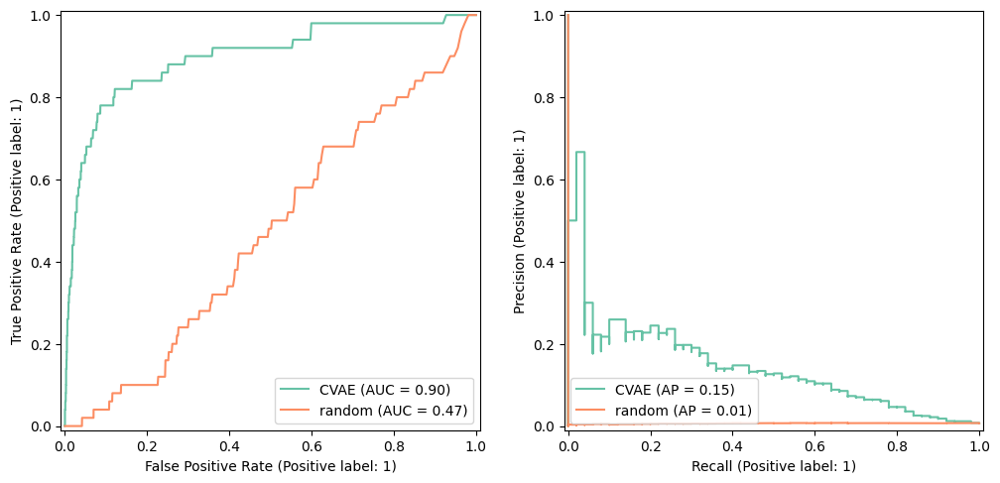

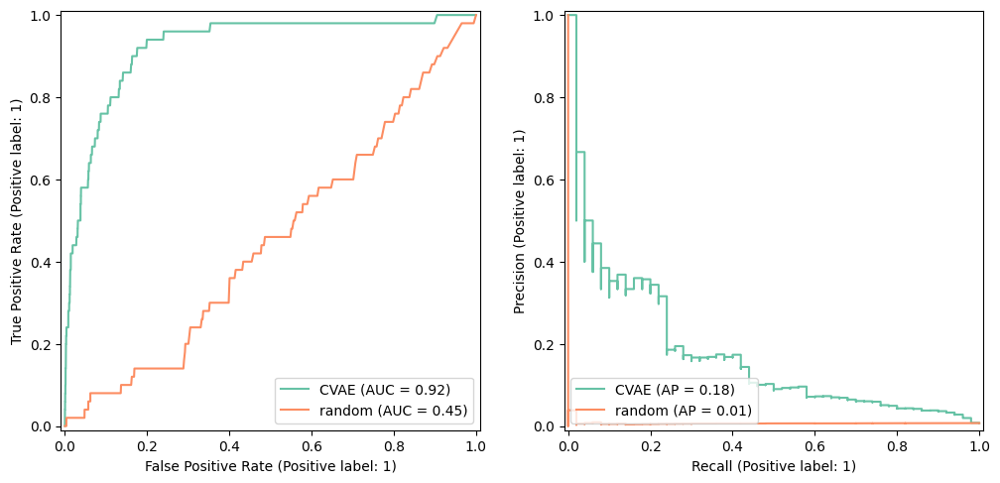

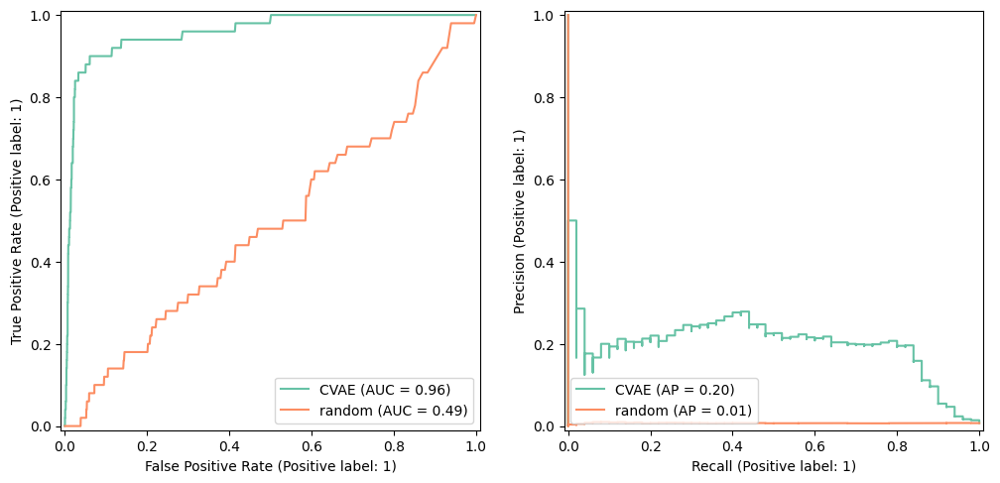

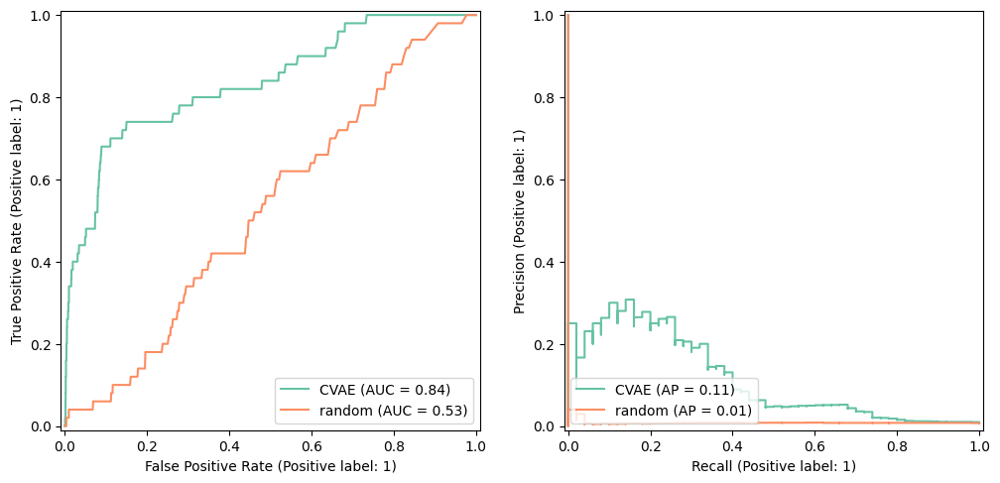

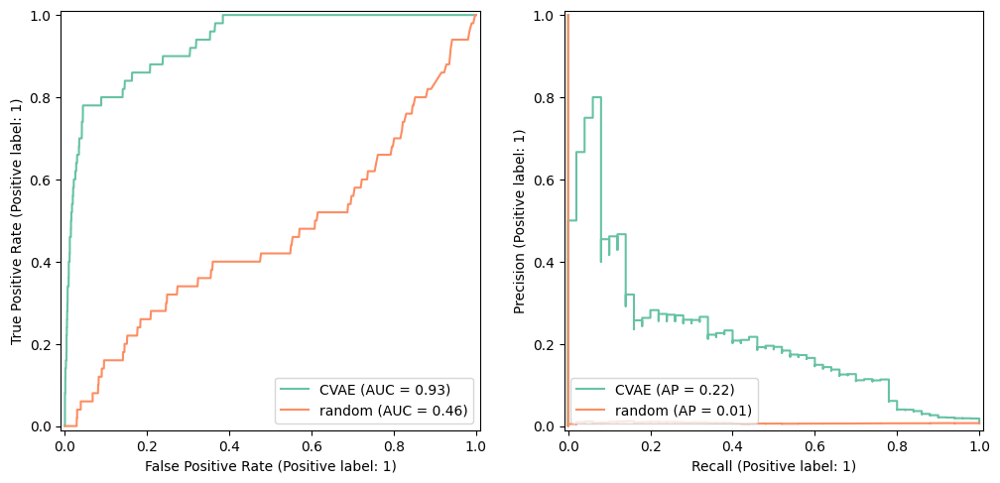

...

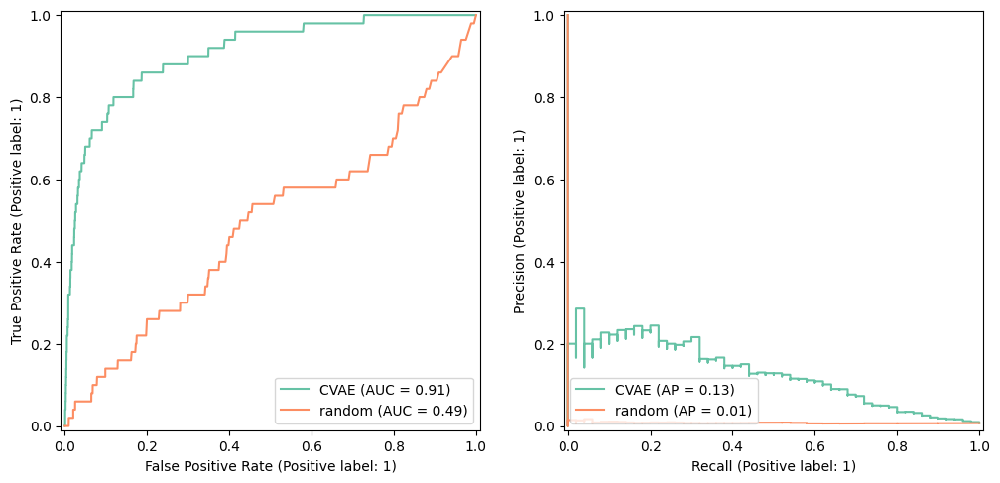

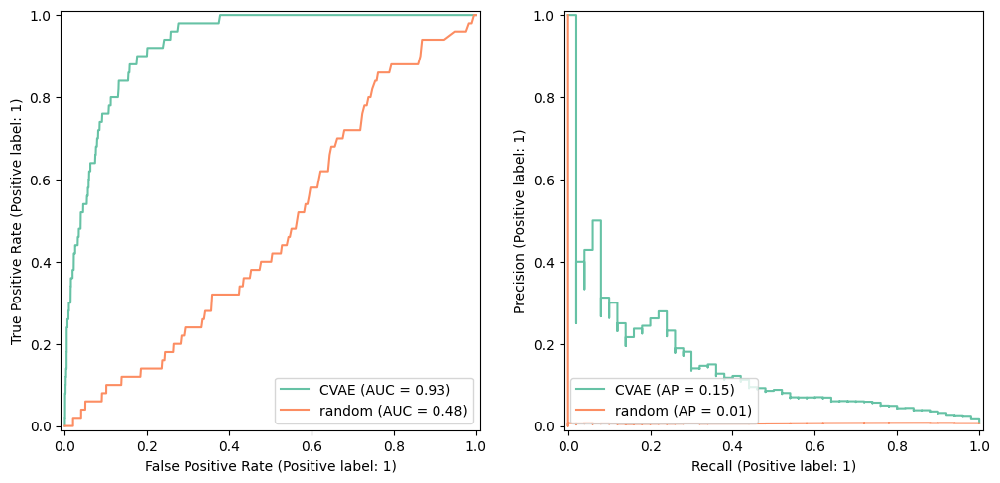

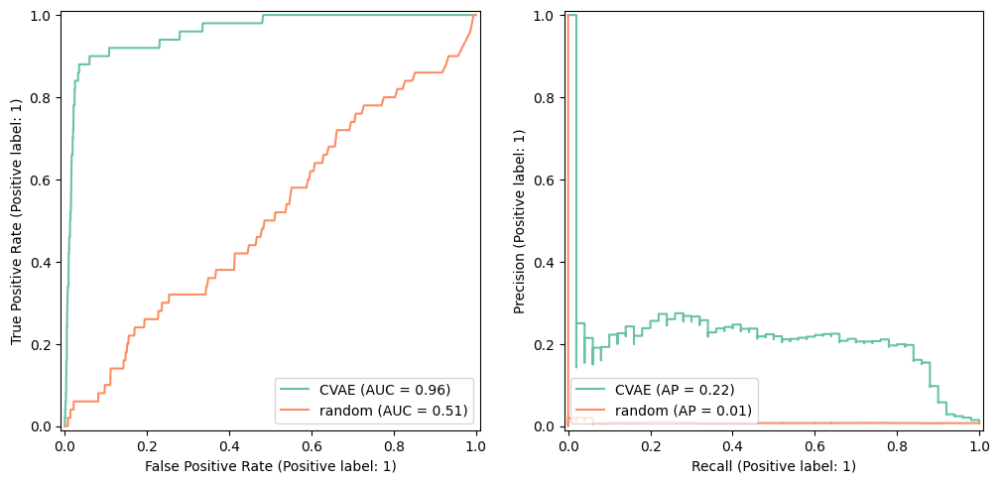

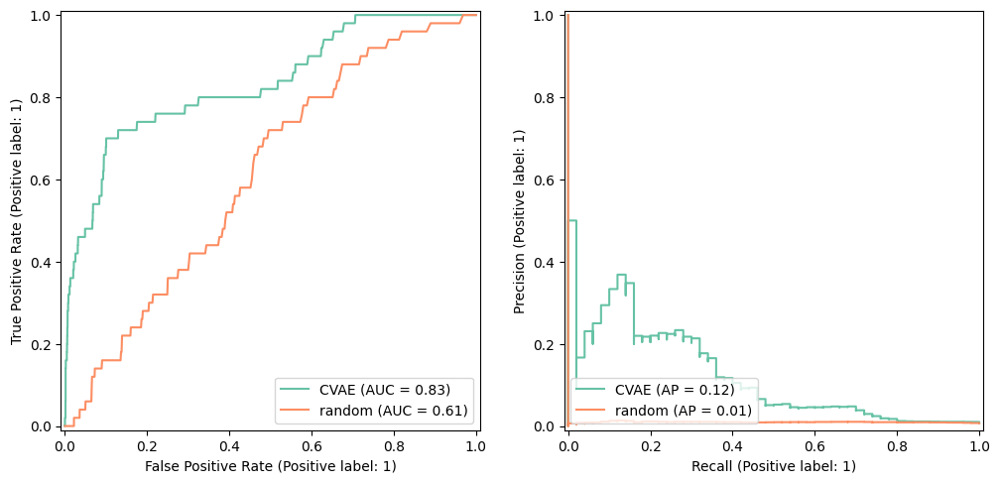

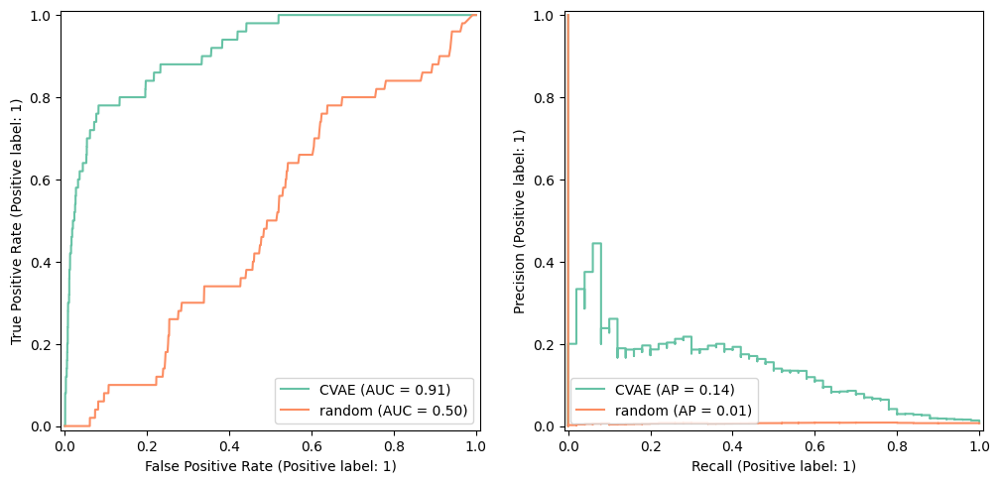

In [151]:
num_top = 50
pr_df1 = get_PRAUC(curr_treatment,
                    meta_df, X_full, Y_full,
                    drug_full, drug_full, drug_full,
                    res1, union_genes, scaler, clip_upper, num_top)

pr_df2 = get_PRAUC(curr_treatment,
                    meta_df, X_full, Y_full,
                    drug_full, drug_full, drug_full,
                    res2, union_genes, scaler, clip_upper, num_top)

pr_df3 = get_PRAUC(curr_treatment,
                    meta_df, X_full, Y_full,
                    drug_full, drug_full, drug_full,
                    res3, union_genes, scaler, clip_upper, num_top)

pr_all = pd.concat([pr_df1, pr_df2, pr_df3])

prauc_res_file = os.path.join(res_data_path, f"{res_id}_{num_top}_CVAE_prauc.csv")
pr_all.to_csv(prauc_res_file, index=False)

Fedratinib (SAR302503, TG101348)_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Tanespimycin (17-AAG)_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Trametinib (GSK1120212)_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Triamcinolone Acetonide_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Trichostatin A (TSA)_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Fedratinib (SAR302503, TG101348)_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Tanespimycin (17-AAG)_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Trametinib (GSK1120212)_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Triamcinolone Acetonide_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Trichostatin A (TSA)_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Fedratinib (SAR302503, TG101348)_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Tanespimycin (17-AAG)_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Trametinib (GSK1120212)_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Triamcinolone Acetonide_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


Trichostatin A (TSA)_MCF7 MCF7


/tmp/ipykernel_1242139/3714465926.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.top_DE.iloc[range(0,num_top)] = 1


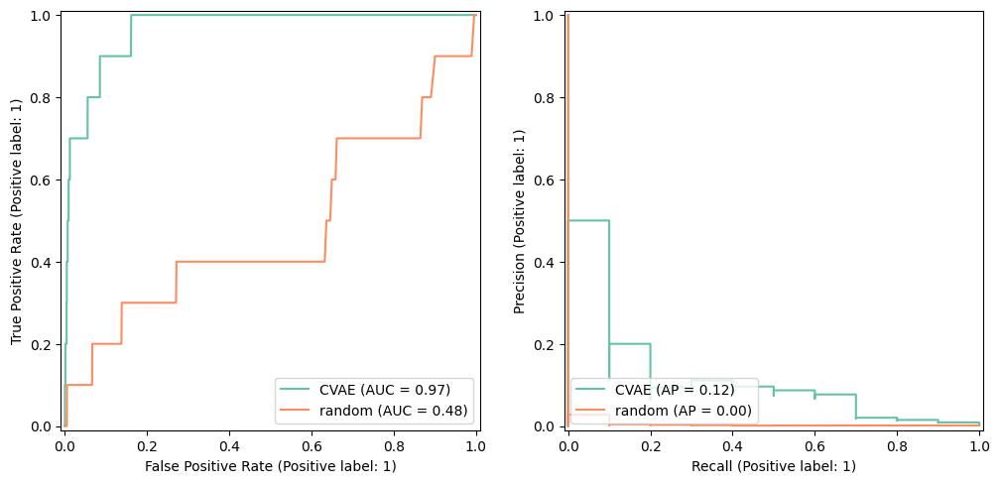

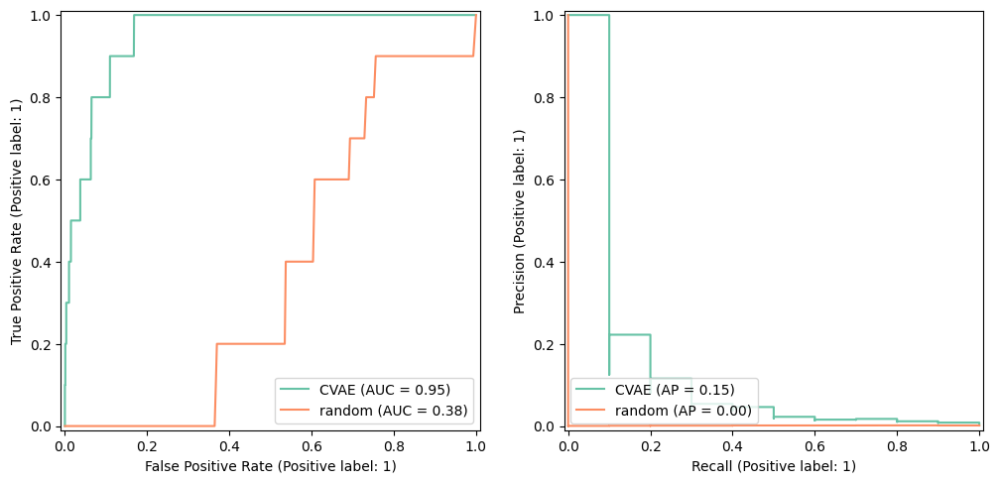

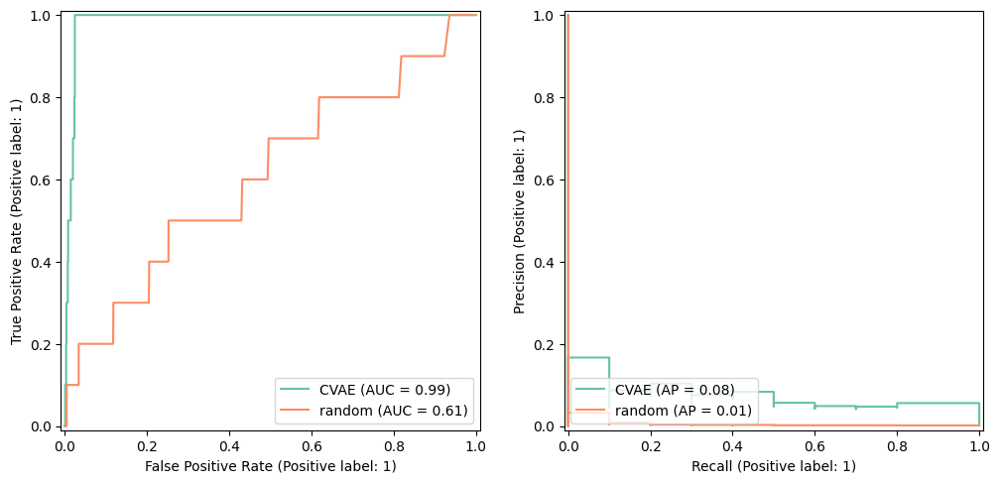

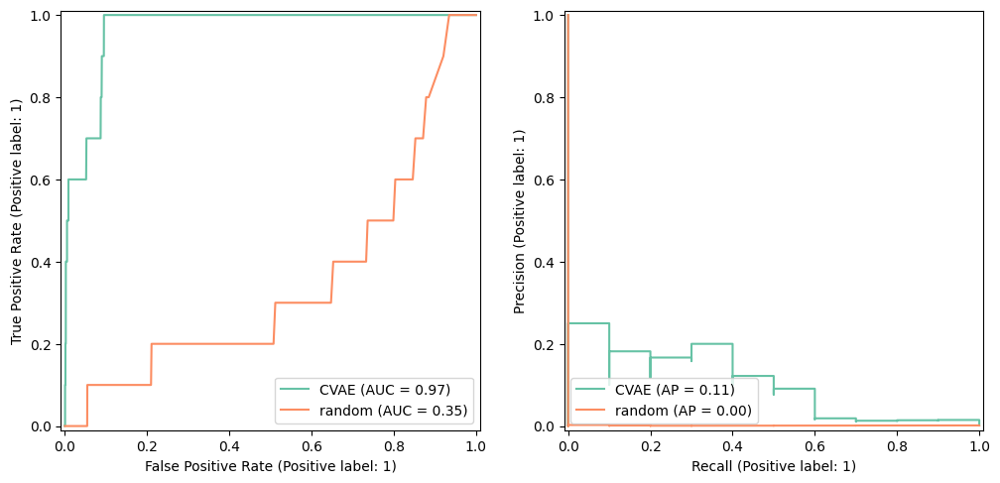

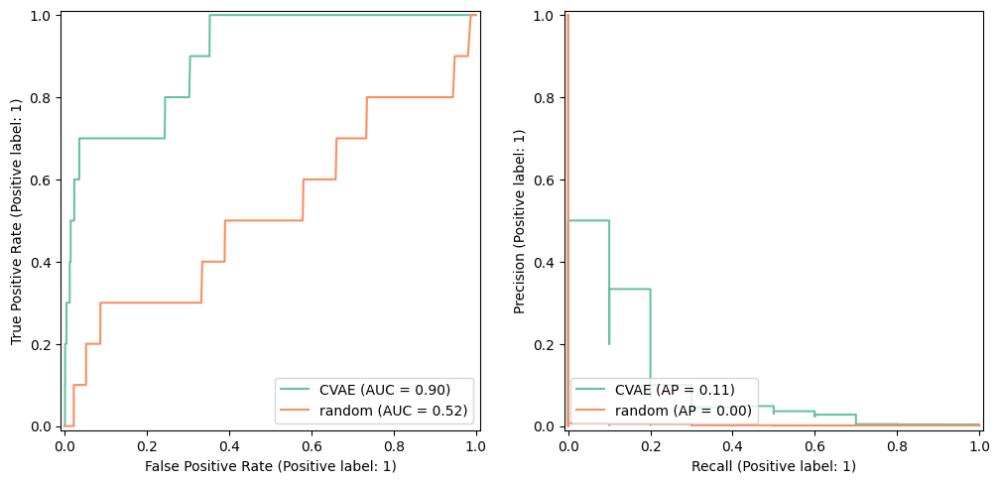

...

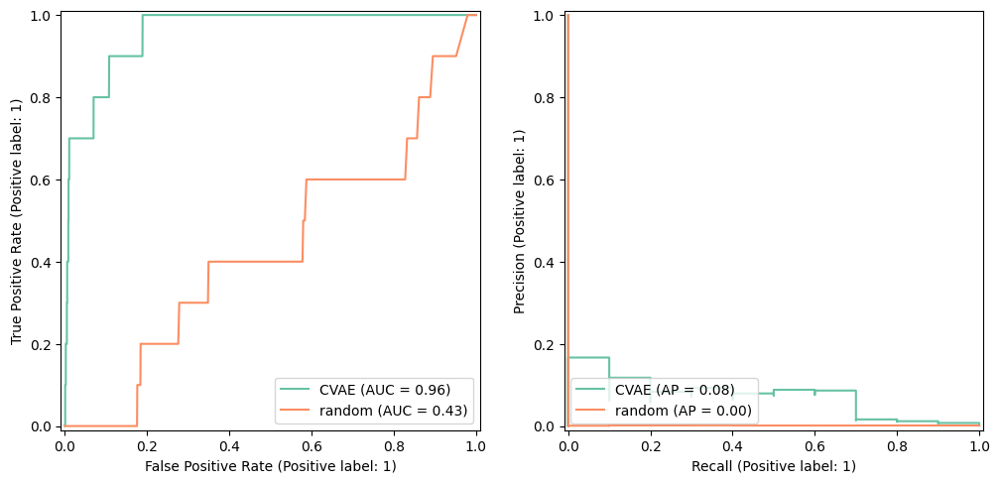

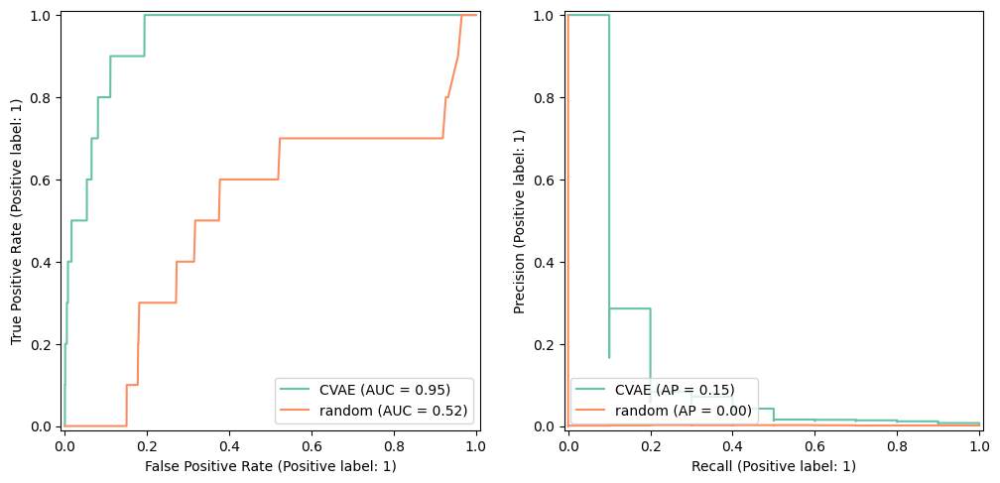

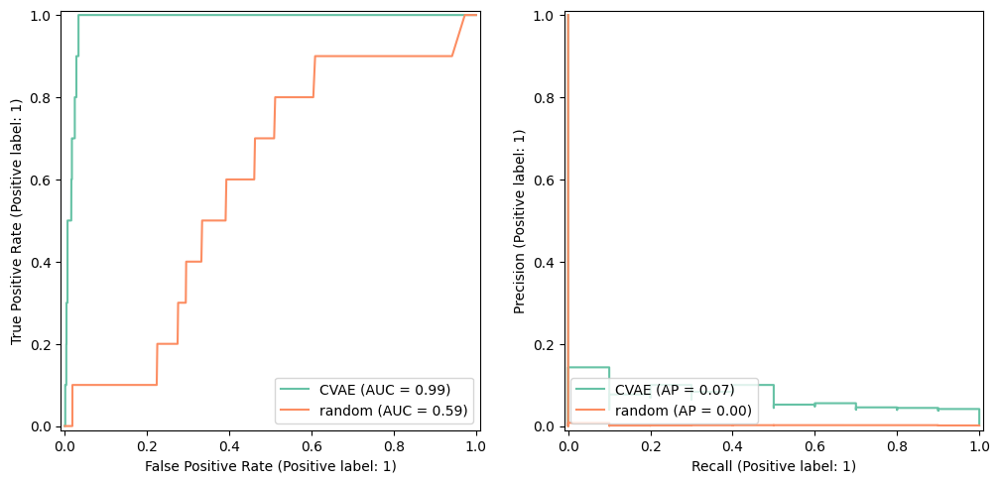

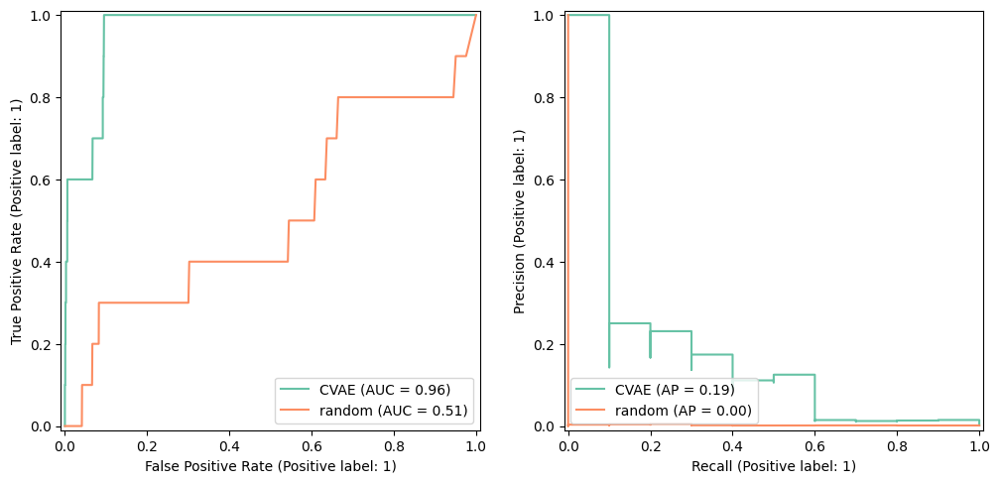

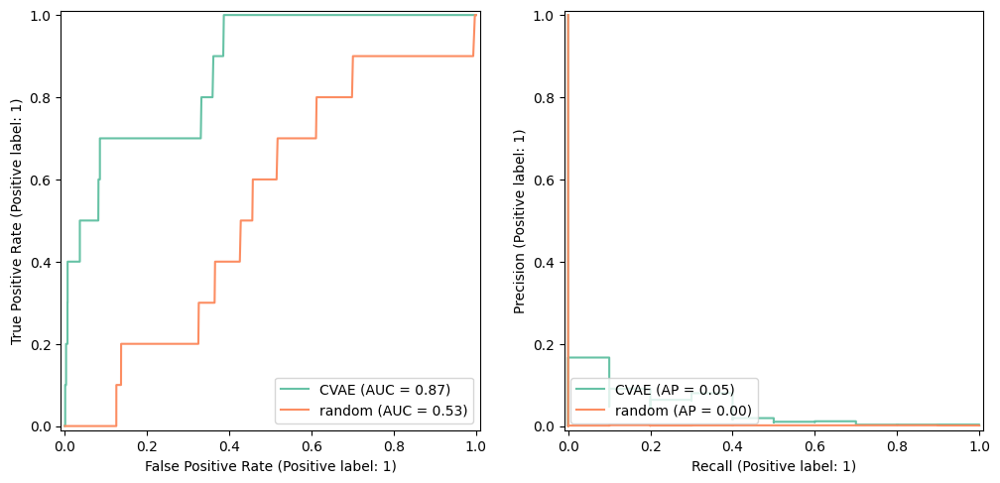

In [152]:
num_top = 10
pr_df1 = get_PRAUC(curr_treatment,
                    meta_df, X_full, Y_full,
                    drug_full, drug_full, drug_full,
                    res1, union_genes, scaler, clip_upper, num_top)

pr_df2 = get_PRAUC(curr_treatment,
                    meta_df, X_full, Y_full,
                    drug_full, drug_full, drug_full,
                    res2, union_genes, scaler, clip_upper, num_top)

pr_df3 = get_PRAUC(curr_treatment,
                    meta_df, X_full, Y_full,
                    drug_full, drug_full, drug_full,
                    res3, union_genes, scaler, clip_upper, num_top)

pr_all = pd.concat([pr_df1, pr_df2, pr_df3])

prauc_res_file = os.path.join(res_data_path, f"{res_id}_{num_top}_CVAE_prauc.csv")
pr_all.to_csv(prauc_res_file, index=False)

In [153]:
pr_all

,scores,metric,cell_type,ref_set,method,num_top,perturbation
0,0.120884,avg_pr,MCF7,sc,CVAE,10,"Fedratinib (SAR302503, TG101348)_MCF7"
1,0.004539,avg_pr,MCF7,sc,random,10,"Fedratinib (SAR302503, TG101348)_MCF7"
0,0.151352,avg_pr,MCF7,sc,CVAE,10,Tanespimycin (17-AAG)_MCF7
1,0.001224,avg_pr,MCF7,sc,random,10,Tanespimycin (17-AAG)_MCF7
0,0.077988,avg_pr,MCF7,sc,CVAE,10,Trametinib (GSK1120212)_MCF7
1,0.005889,avg_pr,MCF7,sc,random,10,Trametinib (GSK1120212)_MCF7
0,0.107202,avg_pr,MCF7,sc,CVAE,10,Triamcinolone Acetonide_MCF7
1,0.001312,avg_pr,MCF7,sc,random,10,Triamcinolone Acetonide_MCF7
0,0.110470,avg_pr,MCF7,sc,CVAE,10,Trichostatin A (TSA)_MCF7
1,0.002792,avg_pr,MCF7,sc,random,10,Trichostatin A (TSA)_MCF7


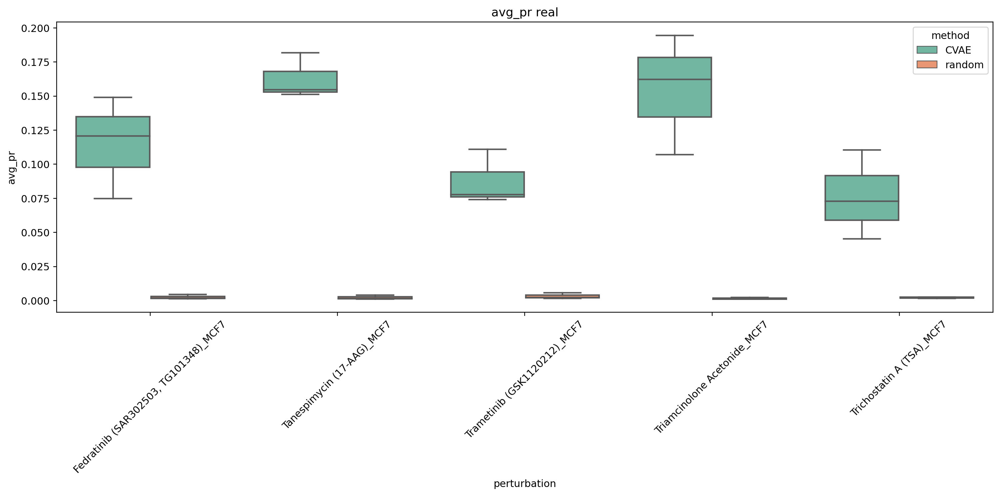

In [154]:

# plot
fig, axs = plt.subplots(1, 1, figsize=(14,7), dpi=216)

sns.boxplot(data=pr_all, 
            x="perturbation", y="scores",
            hue="method", ax= axs)
axs.set_title("avg_pr real")
axs.set(ylabel="avg_pr")
axs.tick_params(axis='x', rotation=45)


fig.show()
fig.tight_layout()

